In [207]:
#data description
#pip install


In [208]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
warnings.filterwarnings('ignore')


In [209]:
#data loading

In [210]:
df=pd.read_csv("employee_promotion.csv")
df

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,0,49.0,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,60.0,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,50.0,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,50.0,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,73.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,78.0,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,56.0,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,0,79.0,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,NaN,0


In [211]:
df.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,0,49.0,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,60.0,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,50.0,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,50.0,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,73.0,0


In [212]:
df.tail()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,78.0,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,56.0,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,0,79.0,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,NaN,0
54807,51526,HR,region_22,Bachelor's,m,other,1,27,1.0,5,0,49.0,0


In [213]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  awards_won            54808 non-null  int64  
 11  avg_training_score    52248 non-null  float64
 12  is_promoted           54808 non-null  int64  
dtypes: float64(2), int64(6), object(5)
memory usage: 5.4+ MB


In [214]:
df.shape

(54808, 13)

In [215]:
df.size

712504

In [216]:
df.notnull

<bound method DataFrame.notnull of        employee_id         department     region         education gender  \
0            65438  Sales & Marketing   region_7  Master's & above      f   
1            65141         Operations  region_22        Bachelor's      m   
2             7513  Sales & Marketing  region_19        Bachelor's      m   
3             2542  Sales & Marketing  region_23        Bachelor's      m   
4            48945         Technology  region_26        Bachelor's      m   
...            ...                ...        ...               ...    ...   
54803         3030         Technology  region_14        Bachelor's      m   
54804        74592         Operations  region_27  Master's & above      f   
54805        13918          Analytics   region_1        Bachelor's      m   
54806        13614  Sales & Marketing   region_9               NaN      m   
54807        51526                 HR  region_22        Bachelor's      m   

      recruitment_channel  no_of_trainin

In [217]:
df.columns

Index(['employee_id', 'department', 'region', 'education', 'gender',
       'recruitment_channel', 'no_of_trainings', 'age', 'previous_year_rating',
       'length_of_service', 'awards_won', 'avg_training_score', 'is_promoted'],
      dtype='object')

In [218]:
df.dropna

<bound method DataFrame.dropna of        employee_id         department     region         education gender  \
0            65438  Sales & Marketing   region_7  Master's & above      f   
1            65141         Operations  region_22        Bachelor's      m   
2             7513  Sales & Marketing  region_19        Bachelor's      m   
3             2542  Sales & Marketing  region_23        Bachelor's      m   
4            48945         Technology  region_26        Bachelor's      m   
...            ...                ...        ...               ...    ...   
54803         3030         Technology  region_14        Bachelor's      m   
54804        74592         Operations  region_27  Master's & above      f   
54805        13918          Analytics   region_1        Bachelor's      m   
54806        13614  Sales & Marketing   region_9               NaN      m   
54807        51526                 HR  region_22        Bachelor's      m   

      recruitment_channel  no_of_training

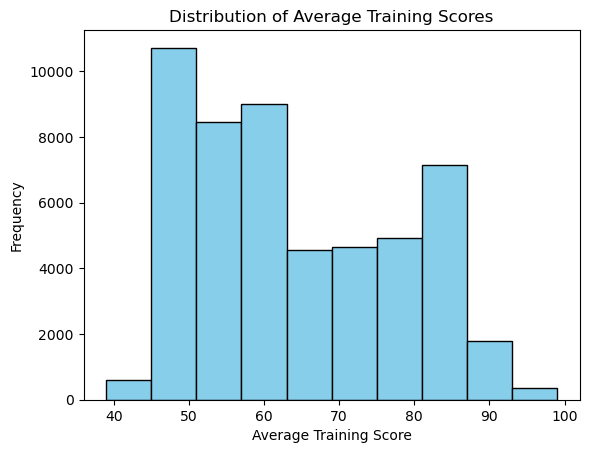

In [219]:
plt.hist(df['avg_training_score'], bins=10, color='skyblue', edgecolor='black')
plt.title('Distribution of Average Training Scores')
plt.xlabel('Average Training Score')
plt.ylabel('Frequency')
plt.show()

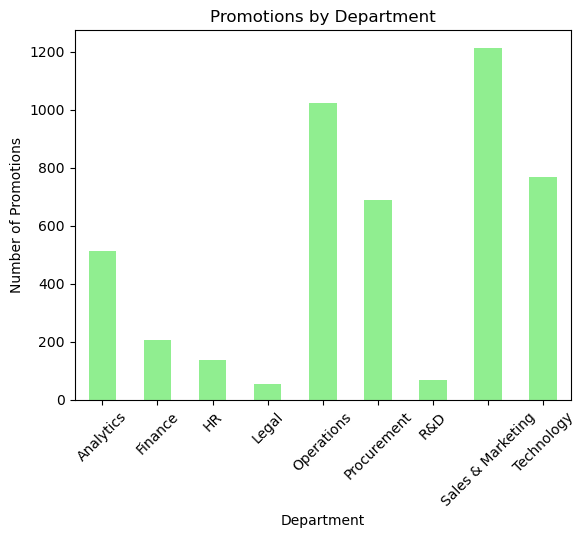

In [220]:
promotion_by_dept = df.groupby('department')['is_promoted'].sum()
promotion_by_dept.plot(kind='bar', color='lightgreen')
plt.title('Promotions by Department')
plt.xlabel('Department')
plt.ylabel('Number of Promotions')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

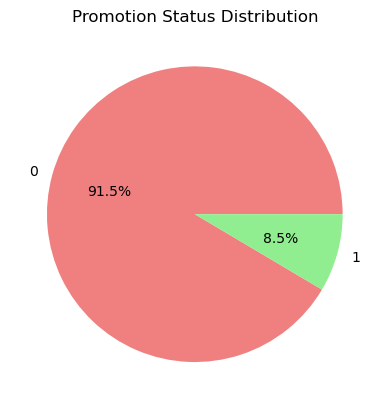

In [221]:
promotion_counts = df['is_promoted'].value_counts()
promotion_counts.plot(kind='pie', autopct='%1.1f%%', colors=['lightcoral', 'lightgreen'])
plt.title('Promotion Status Distribution')
plt.ylabel('')  # Remove y-axis label for better appearance
plt.show()

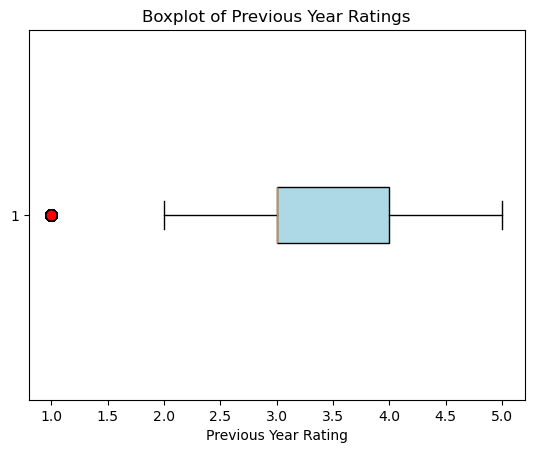

In [222]:
plt.boxplot(df['previous_year_rating'].dropna(), vert=False, patch_artist=True, 
            boxprops=dict(facecolor='lightblue', color='black'),
            whiskerprops=dict(color='black'), flierprops=dict(markerfacecolor='red', marker='o', markersize=8))
plt.title('Boxplot of Previous Year Ratings')
plt.xlabel('Previous Year Rating')
plt.show()

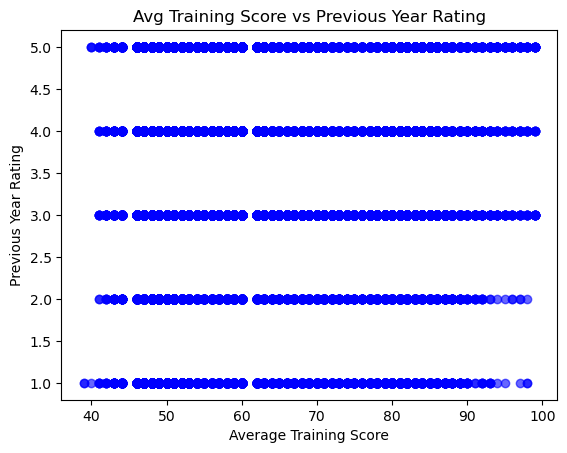

In [223]:
plt.scatter(df['avg_training_score'], df['previous_year_rating'], alpha=0.6, color='blue')
plt.title('Avg Training Score vs Previous Year Rating')
plt.xlabel('Average Training Score')
plt.ylabel('Previous Year Rating')
plt.show()

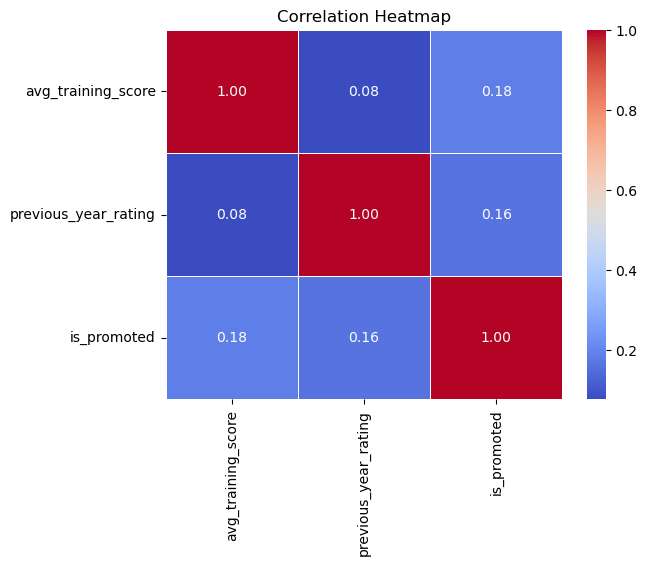

In [224]:
corr_matrix = df[['avg_training_score', 'previous_year_rating', 'is_promoted']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [225]:
#Grouping employees by education and checking the number of promotions
emp_edu_promotion = df.groupby('education')['is_promoted'].sum()
print(emp_edu_promotion)

education
Bachelor's          3008
Below Secondary       67
Master's & above    1471
Name: is_promoted, dtype: int64


In [226]:
#grouping employees by department and region to count employees:
emp_edu_promotion = df.groupby('education')['is_promoted'].sum()
print(emp_edu_promotion)

education
Bachelor's          3008
Below Secondary       67
Master's & above    1471
Name: is_promoted, dtype: int64


In [227]:
#Grouping by department and summarizing performance:
dept_summary = df.groupby('department')[['previous_year_rating', 'avg_training_score']].mean()
print(dept_summary)


                   previous_year_rating  avg_training_score
department                                                 
Analytics                      3.557307           84.602952
Finance                        3.506436           60.111661
HR                             3.482965           50.182482
Legal                          3.405281           59.716157
Operations                     3.632156           60.118521
Procurement                    3.298852           70.126279
R&D                            3.563596           84.596597
Sales & Marketing              3.067937           50.427416
Technology                     3.158677           79.928692


In [228]:
#Grouping employees by gender and checking promotions:
gender_promotion = df.groupby('gender')['is_promoted'].sum()
print(gender_promotion)



gender
f    1467
m    3201
Name: is_promoted, dtype: int64


In [229]:
#Grouping by number of trainings to see average ratings:
training_ratings = df.groupby('no_of_trainings')['previous_year_rating'].mean()
print(training_ratings)

no_of_trainings
1     3.361322
2     3.238394
3     3.097274
4     2.905109
5     2.722689
6     2.617647
7     3.200000
8     2.750000
9     2.666667
10    2.600000
Name: previous_year_rating, dtype: float64


In [230]:
# Group by education and count employees
edu_group = df.groupby('education').size()

print(edu_group)

education
Bachelor's          36669
Below Secondary       805
Master's & above    14925
dtype: int64


In [231]:
# Group by department and education, then count
dept_edu_group = df.groupby(['department', 'education']).size()

print(dept_edu_group)

department         education       
Analytics          Bachelor's           3978
                   Master's & above     1037
Finance            Bachelor's           1895
                   Below Secondary       106
                   Master's & above      499
HR                 Bachelor's           1525
                   Below Secondary       128
                   Master's & above      733
Legal              Bachelor's            814
                   Below Secondary        65
                   Master's & above      156
Operations         Bachelor's           7781
                   Below Secondary       176
                   Master's & above     3165
Procurement        Bachelor's           4393
                   Below Secondary       129
                   Master's & above     2544
R&D                Bachelor's            542
                   Master's & above      429
Sales & Marketing  Bachelor's          11099
                   Master's & above     4166
Technology         

In [232]:
# Group by department and calculate average training score
dept_avg_training = df.groupby('department')['avg_training_score'].mean()

print(dept_avg_training)

department
Analytics            84.602952
Finance              60.111661
HR                   50.182482
Legal                59.716157
Operations           60.118521
Procurement          70.126279
R&D                  84.596597
Sales & Marketing    50.427416
Technology           79.928692
Name: avg_training_score, dtype: float64


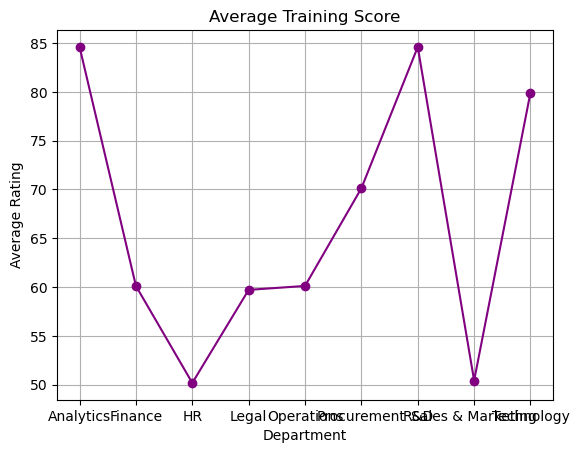

In [233]:
avg_training_score = df.groupby('department')['avg_training_score'].mean()
avg_training_score.plot(kind='line', marker='o', color='purple')
plt.title('Average Training Score')
plt.xlabel('Department')
plt.ylabel('Average Rating')
plt.grid(True)
plt.show()

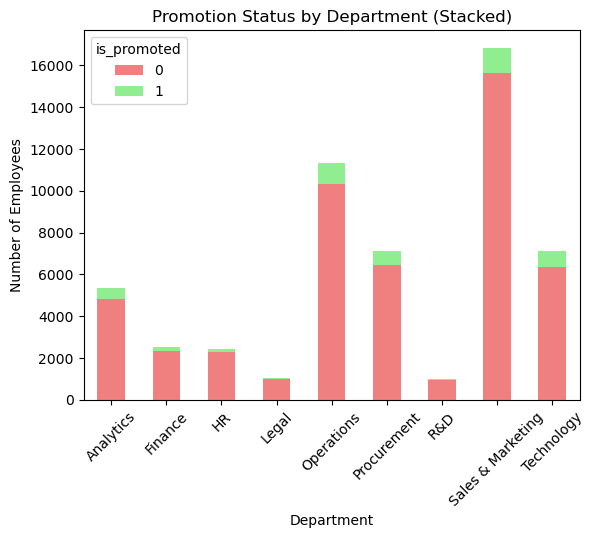

In [234]:
# Stacked bar chart for promotion status by department
promotion_by_dept = df.groupby(['department', 'is_promoted']).size().unstack()
promotion_by_dept.plot(kind='bar', stacked=True, color=['lightcoral', 'lightgreen'])
plt.title('Promotion Status by Department (Stacked)')
plt.xlabel('Department')
plt.ylabel('Number of Employees')
plt.xticks(rotation=45)
plt.show()


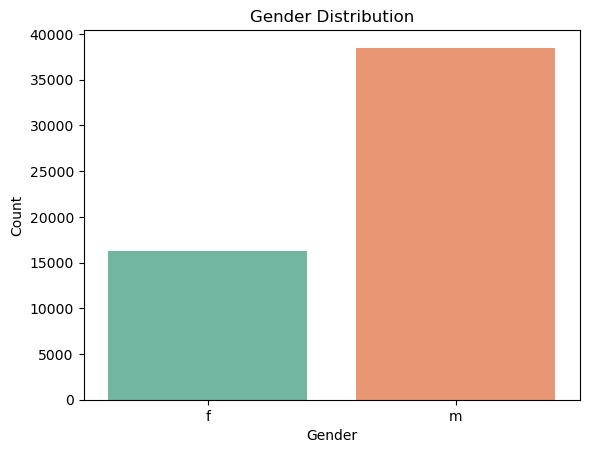

In [235]:
# Count plot for gender distribution
sns.countplot(x='gender', data=df, palette='Set2')
plt.title('Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()


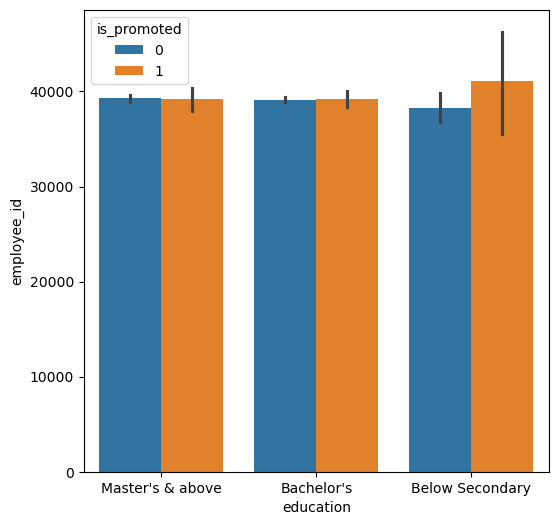

<Axes: xlabel='gender', ylabel='count'>

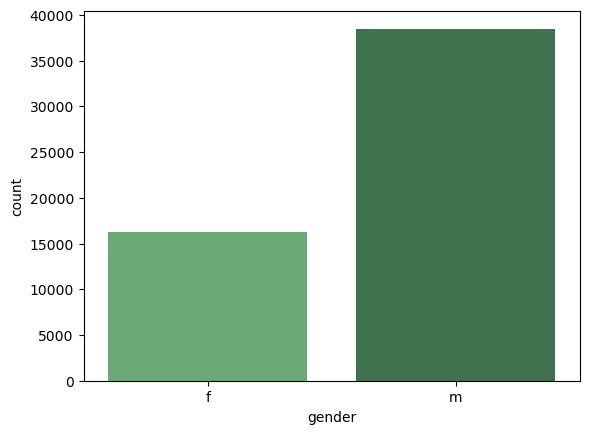

In [236]:
#eda analysis
plt.figure(figsize=(6,6))
sns.barplot(x='education',y='employee_id',hue='is_promoted',data=df)
plt.show()

sns.countplot(x='gender',data=df,palette='Greens_d')

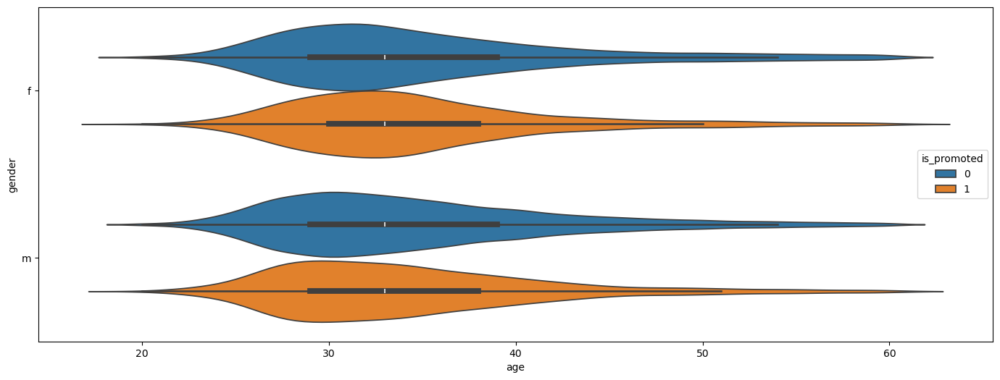

In [237]:
plt.figure(figsize=(17,6))
sns.violinplot(x='age',y='gender',hue='is_promoted',data=df)
plt.show()

In [238]:
import plotly.express as px
px.pie(df,values='awards_won',names='education',template='plotly_dark')


In [239]:
px.violin(df,df['department'],template='plotly_dark')

In [240]:
px.box(df,df['age'],df['length_of_service'],color='gender',title='Length of Service',template='plotly_dark')

In [241]:
px.pie(df,values='is_promoted',names='department',template = 'plotly_dark')

In [242]:
px.violin(df,df['department'],df['awards_won'],color='department',title='Departments - Awards_won',template='plotly_dark')

In [243]:
col=['department','region','recruitment_channel','education']

for i in col:
    print(i)
    print(df[i].unique())
    print(df[i].nunique())
    print()

department
['Sales & Marketing' 'Operations' 'Technology' 'Analytics' 'R&D'
 'Procurement' 'Finance' 'HR' 'Legal']
9

region
['region_7' 'region_22' 'region_19' 'region_23' 'region_26' 'region_2'
 'region_20' 'region_34' 'region_1' 'region_4' 'region_29' 'region_31'
 'region_15' 'region_14' 'region_11' 'region_5' 'region_28' 'region_17'
 'region_13' 'region_16' 'region_25' 'region_10' 'region_27' 'region_30'
 'region_12' 'region_21' 'region_8' 'region_32' 'region_6' 'region_33'
 'region_24' 'region_3' 'region_9' 'region_18']
34

recruitment_channel
['sourcing' 'other' 'referred']
3

education
["Master's & above" "Bachelor's" nan 'Below Secondary']
3



In [244]:
numeric_df =df.select_dtypes(include=['number'])  # Select numeric columns only
numeric_df.corr()

,employee_id,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
employee_id,1.000000,-0.005121,0.000437,0.004533,0.001274,0.008420,-0.000661,0.001206
no_of_trainings,-0.005121,1.000000,-0.081278,-0.063126,-0.057275,-0.007628,0.044430,-0.024896
age,0.000437,-0.081278,1.000000,0.006008,0.657111,-0.008169,-0.049500,-0.017166
previous_year_rating,0.004533,-0.063126,0.006008,1.000000,0.000253,0.027738,0.075474,0.159320
length_of_service,0.001274,-0.057275,0.657111,0.000253,1.000000,-0.039927,-0.039381,-0.010670
awards_won,0.008420,-0.007628,-0.008169,0.027738,-0.039927,1.000000,0.073963,0.195871
avg_training_score,-0.000661,0.044430,-0.049500,0.075474,-0.039381,0.073963,1.000000,0.184386
is_promoted,0.001206,-0.024896,-0.017166,0.159320,-0.010670,0.195871,0.184386,1.000000


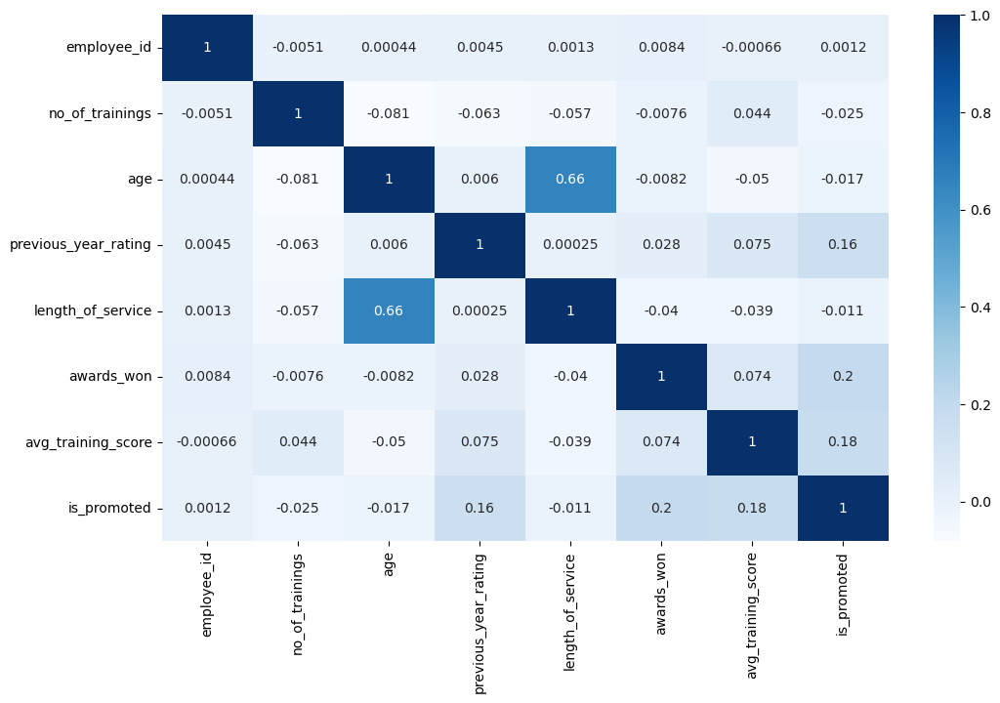

In [245]:
plt.figure(figsize=(12,7))
sns.heatmap(numeric_df.corr(),annot=True,cmap='Blues')
plt.show()


In [246]:
from sklearn.preprocessing import LabelEncoder
l=LabelEncoder()
for i in df.columns:
    if df[i].dtype == 'object':
        df[i]=l.fit_transform(df[i])

In [247]:
df.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,65438,7,31,2,0,2,1,35,5.0,8,0,49.0,0
1,65141,4,14,0,1,0,1,30,5.0,4,0,60.0,0
2,7513,7,10,0,1,2,1,34,3.0,7,0,50.0,0
3,2542,7,15,0,1,0,2,39,1.0,10,0,50.0,0
4,48945,8,18,0,1,0,1,45,3.0,2,0,73.0,0


In [248]:
x=df.drop('is_promoted',axis=1)
y=df['is_promoted']

In [249]:
from sklearn.model_selection import train_test_split
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.30)

In [250]:
from sklearn.preprocessing import MinMaxScaler 
mms=MinMaxScaler(feature_range=(0,1))
xtrain=mms.fit_transform(xtrain)
xtest=mms.fit_transform(xtest)
xtrain=pd.DataFrame(xtrain)
xtest=pd.DataFrame(xtest)

In [251]:
R={'Model':[],'Accuracy':[],'Recall':[],'Precision':[],'F1':[]}

In [252]:
Results=pd.DataFrame(R)
Results.head()

,Model,Accuracy,Recall,Precision,F1


In [253]:
df

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,65438,7,31,2,0,2,1,35,5.0,8,0,49.0,0
1,65141,4,14,0,1,0,1,30,5.0,4,0,60.0,0
2,7513,7,10,0,1,2,1,34,3.0,7,0,50.0,0
3,2542,7,15,0,1,0,2,39,1.0,10,0,50.0,0
4,48945,8,18,0,1,0,1,45,3.0,2,0,73.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,8,5,0,1,2,1,48,3.0,17,0,78.0,0
54804,74592,4,19,2,0,0,1,37,2.0,6,0,56.0,0
54805,13918,0,0,0,1,0,1,27,5.0,3,0,79.0,0
54806,13614,7,33,3,1,2,1,29,1.0,2,0,NaN,0


In [259]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, recall_score, f1_score, precision_score
import pandas as pd

# Handle missing values
imputer = SimpleImputer(strategy='mean')
xtrain = imputer.fit_transform(xtrain)
xtest = imputer.transform(xtest)

lr = LogisticRegression()
dc = DecisionTreeClassifier()
rf = RandomForestClassifier()

model = [lr, dc, rf]

Results = pd.DataFrame(columns=['Model', 'Accuracy', 'Recall', 'Precision', 'F1'])

for models in model:
    models.fit(xtrain, ytrain)
    ypred = models.predict(xtest)
    
    print('Model :', models)
    print('--------------------------------------------------------------------------------------------------------------')
    print('Confusion Matrix:\n', confusion_matrix(ytest, ypred))
    print('Classification Report:\n', classification_report(ytest, ypred))
    print('Accuracy:', round(accuracy_score(ytest, ypred), 2))
    print('Precision:', round(precision_score(ytest, ypred), 2))
    print('Recall:', round(recall_score(ytest, ypred), 2))
    print('F1 Score:', round(f1_score(ytest, ypred), 2))
    
    R = pd.DataFrame([{
        'Model': type(models).__name__,
        'Accuracy': round(accuracy_score(ytest, ypred), 2),
        'Recall': round(recall_score(ytest, ypred), 2),
        'Precision': round(precision_score(ytest, ypred), 2),
        'F1': round(f1_score(ytest, ypred), 2)
    }])
    Results = pd.concat([Results, R], ignore_index=True)


Model : LogisticRegression()
--------------------------------------------------------------------------------------------------------------
Confusion Matrix:
 [[15038    40]
 [ 1261   104]]
Classification Report:
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     15078
           1       0.72      0.08      0.14      1365

    accuracy                           0.92     16443
   macro avg       0.82      0.54      0.55     16443
weighted avg       0.91      0.92      0.89     16443

Accuracy: 0.92
Precision: 0.72
Recall: 0.08
F1 Score: 0.14
Model : DecisionTreeClassifier()
--------------------------------------------------------------------------------------------------------------
Confusion Matrix:
 [[13932  1146]
 [  866   499]]
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.92      0.93     15078
           1       0.30      0.37      0.33      1365

    accuracy      

In [260]:
Results

,Model,Accuracy,Recall,Precision,F1
0,LogisticRegression,0.92,0.08,0.72,0.14
1,DecisionTreeClassifier,0.88,0.37,0.30,0.33
2,RandomForestClassifier,0.93,0.22,0.87,0.35


In [265]:
import pickle
for model in models:
    filename = model.__class__.__name__+'.pkl'
    with open(filename,'wb') as f:
        pickle.dump(model, f)
    print(f"Model saved: {filename}")

Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
Model saved: DecisionTreeClassifier.pkl
